In [2]:

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_probability as tfp

In [3]:
import pandas as pd
# 导入 Excel 数据
file_path = r"C:\Users\Administrator\Desktop\PIBNN.xlsx"  # 替换为实际路径
data = pd.read_excel(file_path)

# 查看数据
print(data.head())  # 打印前5行数据


      RH        Ka    da/dNm  da/dN_std   RH.1        Kc    dc/dNm  \
0  0.232  5.689193  0.000202   0.000128  0.232  5.626664  0.001323   
1  0.232  5.696460  0.000214   0.000135  0.232  5.629040  0.001316   
2  0.232  5.704818  0.000266   0.000145  0.232  5.630706  0.001566   
3  0.232  5.718260  0.000326   0.000169  0.232  5.637590  0.001618   
4  0.232  5.733841  0.000338   0.000191  0.232  5.641403  0.001744   

   dc/dN_std2     RM      Ka.1  ...  dc/dN_mean2  dc/dN_std2.1   RL      Ka.2  \
0    0.000117  0.456  5.138445  ...     0.024792      0.001500  0.6  1.684494   
1    0.000138  0.456  5.208959  ...     0.025035      0.001500  0.6  1.687079   
2    0.000165  0.456  5.278068  ...     0.026354      0.001500  0.6  1.689661   
3    0.000266  0.456  5.345826  ...     0.025108      0.001501  0.6  1.692239   
4    0.000276  0.456  5.412283  ...     0.026573      0.001501  0.6  1.694814   

   da/dN_mean3  da/dN_std3  RL.1      Kc.2  dc/dN_mean3  dc/dN_std3  
0     0.000298    0.00

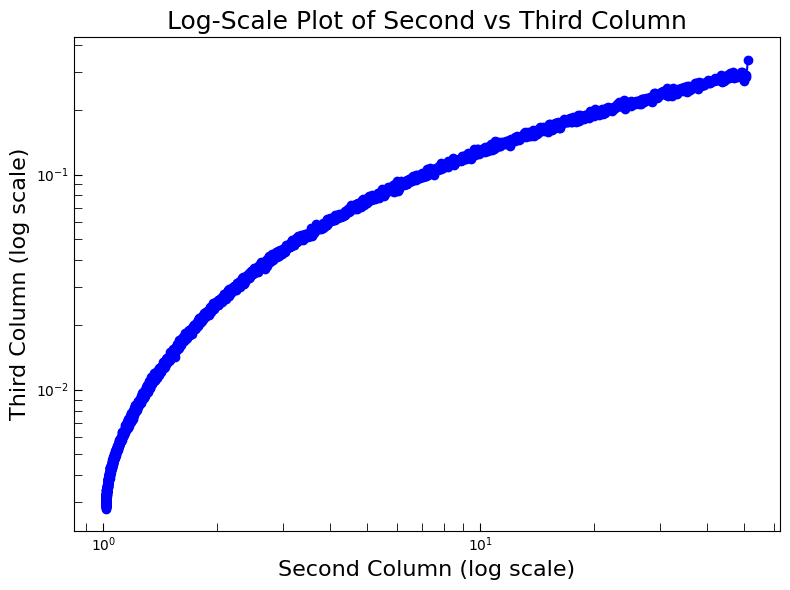

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设 'data' 是一个包含多列的 pandas DataFrame
# data = pd.read_csv('your_data.csv')  # 如果你的数据是从 CSV 文件加载

# 提取第二列和第三列
x_data = data.iloc[:, 21]  # 第二列数据
y_data = data.iloc[:, 22]  # 第三列数据

# 绘制对数坐标图
plt.figure(figsize=(8, 6))
plt.plot(x_data, y_data, marker='o', linestyle='-', color='b')  # 这里可以根据需要调整样式

# 设置对数坐标轴
plt.xscale('log')  # x轴为对数坐标
plt.yscale('log')  # y轴为对数坐标

# 添加标签和标题
plt.xlabel('Second Column (log scale)', fontsize=16)
plt.ylabel('Third Column (log scale)', fontsize=16)
plt.title('Log-Scale Plot of Second vs Third Column', fontsize=18)

# 设置坐标轴的刻度
plt.tick_params(axis='both', which='both', direction='in', length=6)

# 显示图形
plt.tight_layout()
plt.show()


In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split

# 假设数据已加载为 DataFrame `data`
assert data.shape[1] % 8 == 0, "数据列数应该是每组 8 列的倍数！"

# 每组列索引 (根据描述，分为三组)
group_columns = [
    list(range(0, 8)),    # 第 1 组 a 和 c 的相关数据
    list(range(8, 16)),   # 第 2 组 a 和 c 的相关数据
    list(range(16, 24))   # 第 3 组 a 和 c 的相关数据
]

# 初始化存储 Task1 和 Task2 的数据
task1_train_combined = pd.DataFrame(columns=["R", "Ka", "da/dN_mean", "da/dN_std"])  # Task1 的训练数据
task1_val_combined = pd.DataFrame(columns=["R", "Ka", "da/dN_mean", "da/dN_std"])    # Task1 的验证数据
task1_test_combined = pd.DataFrame(columns=["R", "Ka", "da/dN_mean", "da/dN_std"])   # Task1 的测试数据

task2_train_combined = pd.DataFrame(columns=["R", "Kc", "dc/dN_mean", "dc/dN_std"])  # Task2 的训练数据
task2_val_combined = pd.DataFrame(columns=["R", "Kc", "dc/dN_mean", "dc/dN_std"])    # Task2 的验证数据
task2_test_combined = pd.DataFrame(columns=["R", "Kc", "dc/dN_mean", "dc/dN_std"])   # Task2 的测试数据

# 处理每一组数据
for group in group_columns:
    group_data = data.iloc[:, group]  # 提取每组数据
    
    # 分离 Task1 和 Task2 数据
    task1_data = group_data.iloc[:, :4]  # Task1 数据 (前四列)
    task2_data = group_data.iloc[:, 4:]  # Task2 数据 (后四列)

    # 去除 NaN 行
    task1_data = task1_data.dropna(how='any')
    task2_data = task2_data.dropna(how='any')

    # 更新列名以保持一致
    task1_data.columns = ["R", "Ka", "da/dN_mean", "da/dN_std"]
    task2_data.columns = ["R", "Kc", "dc/dN_mean", "dc/dN_std"]

    # 按 20% 划分训练集和测试集
    # 计算每组数据的训练集大小（前20%）
    train_size = int(0.2 * len(task1_data))

    # 训练集：前20%
    task1_train = task1_data.head(train_size)
    task2_train = task2_data.head(train_size)

    # 测试集：后80%
    task1_test = task1_data.tail(len(task1_data) - train_size)
    task2_test = task2_data.tail(len(task2_data) - train_size)

    # 从训练集中再划分出 20% 为验证集
    task1_train, task1_val = train_test_split(task1_train, test_size=0.2, random_state=42, stratify=task1_train['R'])
    task2_train, task2_val = train_test_split(task2_train, test_size=0.2, random_state=42, stratify=task2_train['R'])

    # 合并每组的训练集、验证集、测试集
    task1_train_combined = pd.concat([task1_train_combined, task1_train], axis=0)
    task1_val_combined = pd.concat([task1_val_combined, task1_val], axis=0)
    task1_test_combined = pd.concat([task1_test_combined, task1_test], axis=0)

    task2_train_combined = pd.concat([task2_train_combined, task2_train], axis=0)
    task2_val_combined = pd.concat([task2_val_combined, task2_val], axis=0)
    task2_test_combined = pd.concat([task2_test_combined, task2_test], axis=0)

# 打印结果
print("Task1 训练集大小:", task1_train_combined.shape)
print("Task1 验证集大小:", task1_val_combined.shape)
print("Task1 测试集大小:", task1_test_combined.shape)
print("Task2 训练集大小:", task2_train_combined.shape)
print("Task2 验证集大小:", task2_val_combined.shape)
print("Task2 测试集大小:", task2_test_combined.shape)

# 示例：查看训练集中的 R 分布
print(task1_train_combined['R'].value_counts())
print(task2_train_combined['R'].value_counts())


Task1 训练集大小: (540, 4)
Task1 验证集大小: (136, 4)
Task1 测试集大小: (2712, 4)
Task2 训练集大小: (540, 4)
Task2 验证集大小: (136, 4)
Task2 测试集大小: (2712, 4)
R
0.600    319
0.456    185
0.232     36
Name: count, dtype: int64
R
0.600    319
0.456    185
0.232     36
Name: count, dtype: int64


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14468\4011912683.py:56: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  task1_train_combined = pd.concat([task1_train_combined, task1_train], axis=0)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14468\4011912683.py:57: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  task1_val_combined = pd.concat([task1_val_combined, task1_val], axis=0)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14468\4011912683.py:58: FutureWarning: The behavior of

In [6]:
def preprocess_data_max_only(data, input_columns, mean_columns, std_columns):
    """
    数据预处理：
    1. 输入数据（Ka, Kc）和均值进行最大值归一化；
    2. 方差进行负对数处理后，再进行最大值归一化。
    :param data: 原始数据（Pandas DataFrame 或 NumPy数组）
    :param input_columns: Ka 和 Kc 列索引
    :param mean_columns: 均值列索引（da/dN_mean 和 dc/dN_mean）
    :param std_columns: 方差列索引（da/dN_std 和 dc/dN_std）
    :return: 预处理后的输入、目标数据，及原始输入数据（用于物理约束计算）
    """
    # 最大值归一化
    inputs_normalized = data[:, input_columns] / np.max(data[:, input_columns], axis=0)
    mean_normalized = data[:, mean_columns] / np.max(data[:, mean_columns], axis=0)

    # 方差：负对数处理 + 最大值归一化
    std_normalized = data[:, std_columns]  # 避免 log(0)
    std_normalized = std_normalized / np.max(std_normalized, axis=0)

    # 合并处理后的均值和方差
    targets_normalized = np.hstack([mean_normalized, std_normalized])

    # 返回归一化的输入、目标数据，以及原始输入数据
    return inputs_normalized, targets_normalized, data[:, input_columns]


In [35]:
def prior(kernel_size, bias_size, dtype=None):
    n = kernel_size + bias_size
    prior_model = keras.Sequential(
        [
            tfp.layers.DistributionLambda(
                lambda t: tfp.distributions.MultivariateNormalDiag(
                    loc=tf.zeros(n), scale_diag=tf.ones(n)
                )
            )
        ]
    )
    return prior_model

In [36]:
def posterior(kernel_size, bias_size, dtype=None):
    n = kernel_size + bias_size
    posterior_model = keras.Sequential(
        [
            tfp.layers.VariableLayer(
                tfp.layers.MultivariateNormalTriL.params_size(n), dtype=dtype
            ),
            tfp.layers.MultivariateNormalTriL(n),
        ]
    )
    return posterior_model

In [37]:
tfd = tfp.distributions
class MultiTaskBNN(tf.keras.Model):
    def __init__(self, shared_units, task_units, input_dim):
        super().__init__()
        self.input_dim = input_dim
        self.shared_units=shared_units
        self.task_units=task_units
        # 显式定义模型输入
        self.input_layer = layers.Input(shape=(input_dim,))
        
        # 构建共享网络（使用函数式API）
        shared_features = self._build_shared_network(self.input_layer, self.shared_units)
        
        # 构建任务头
        self.task1_head = self._build_gated_task_head(shared_features, self.task_units[0])
        self.task2_head = self._build_gated_task_head(shared_features, self.task_units[1])
        self.Ca = self.add_weight(name='walker_Ca', shape=[], initializer=tf.keras.initializers.Constant(0.0006), trainable=True)
        self.betaa = self.add_weight(name='walker_betaa', shape=[], initializer=tf.keras.initializers.Constant(1.4), trainable=True)
        self.beta1a = self.add_weight(name='walker_beta1a', shape=[], initializer=tf.keras.initializers.Constant(-1), trainable=True)
        self.Cc = self.add_weight(name='walker_Cc', shape=[], initializer=tf.keras.initializers.Constant(0.0002), trainable=True)
        self.betac = self.add_weight(name='walker_betac', shape=[], initializer=tf.keras.initializers.Constant(1.7), trainable=True)
        self.beta1c = self.add_weight(name='walker_beta1c', shape=[], initializer=tf.keras.initializers.Constant(-1), trainable=True)
        # 构建完整模型
        self.model = tf.keras.Model(
            inputs=self.input_layer,
            outputs=[self.task1_head, self.task2_head]
        )

    def _build_shared_network(self, inputs, shared_units):

        self.x = inputs
        for units in shared_units:
            self.x = layers.BatchNormalization()(self.x)
            self.x = tfp.layers.DenseVariational(
                units=units,
                make_prior_fn=prior,  # 需实现prior
                make_posterior_fn=posterior,  # 需实现posterior
                activation='relu'
            )(self.x)
            self.x = layers.LayerNormalization()(self.x)
            self.x = layers.Dropout(0.1)(self.x)
        return self.x

    def _build_gated_task_head(self, shared_features, units):
        # 隐藏层处理
        inputs = shared_features
        x =  tf.keras.layers.Dense(
            units=units,
            activation='relu'
        )(inputs)
        
        # 门控机制
        gating = layers.Dense(units * 2, activation='linear')(x)
        gated = layers.Lambda(
            lambda x: x[..., :units] * tf.sigmoid(x[..., units:])
        )(gating)
        
        # 分布参数生成
        enhanced = tf.keras.layers.Dense(
            units=units,
            activation='relu'
        )(gated)

        distribution_params = layers.Dense(units=2)(enhanced)
        outputs = tfp.layers.IndependentNormal(1)(distribution_params)
        
        return outputs

    def call(self, inputs):
        shared_features = self._build_shared_network(inputs,self.shared_units)  # 假设共享网络使用 12, 16 单位
        task1_output = self._build_gated_task_head(shared_features, self.task_units[0])  # 重新计算任务头
        task2_output = self._build_gated_task_head(shared_features, self.task_units[1])
        return task1_output, task2_output

In [38]:
model1 = MultiTaskBNN(
    shared_units=[12, 16],
    task_units=[8, 12],  # 假设两个任务都是回归任务
    input_dim=4
)


In [39]:
model1.build(input_shape=(None, 4)) 
model1.summary()

Model: "multi_task_bnn_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          [(None, 1),               25022     
                              (None, 1)]                         
                                                                 
Total params: 25028 (97.77 KB)
Trainable params: 24996 (97.64 KB)
Non-trainable params: 32 (128.00 Byte)
_________________________________________________________________


In [40]:
 # 查看每一层的详细信息
for layer in model1.layers:
    print(layer.name)  # 打印每层的名字
    print(layer.input_shape)  # 打印每层的输入形状
    print(layer.output_shape)  # 打印每层的输出形状




model
(None, 4)
[(None, 1), (None, 1)]


'batch_normalization_403/gamma:0', 'batch_normalization_403/beta:0', 'dense_variational_400/posterior/constant:0', 'layer_normalization_399/gamma:0', 'layer_normalization_399/beta:0', 'batch_normalization_404/gamma:0', 'batch_normalization_404/beta:0', 'dense_variational_401/posterior/constant:0', 'layer_normalization_400/gamma:0', 'layer_normalization_400/beta:0', 'dense_1581/kernel:0', 'dense_1581/bias:0', 'dense_1585/kernel:0', 'dense_1585/bias:0', 'dense_1582/kernel:0', 'dense_1582/bias:0', 'dense_1586/kernel:0', 'dense_1586/bias:0', 'dense_1583/kernel:0', 'dense_1583/bias:0', 'dense_1587/kernel:0', 'dense_1587/bias:0', 'dense_1584/kernel:0', 'dense_1584/bias:0', 'dense_1588/kernel:0', 'dense_1588/bias:0']

In [41]:
for var in model1.trainable_variables:
    print(f"Name: {var.name}, Shape: {var.shape}, Trainable: {var.trainable}")

Name: batch_normalization_302/gamma:0, Shape: (4,), Trainable: True
Name: batch_normalization_302/beta:0, Shape: (4,), Trainable: True
Name: dense_variational_302/posterior/constant:0, Shape: (1890,), Trainable: True
Name: layer_normalization_300/gamma:0, Shape: (12,), Trainable: True
Name: layer_normalization_300/beta:0, Shape: (12,), Trainable: True
Name: batch_normalization_303/gamma:0, Shape: (12,), Trainable: True
Name: batch_normalization_303/beta:0, Shape: (12,), Trainable: True
Name: dense_variational_303/posterior/constant:0, Shape: (21944,), Trainable: True
Name: layer_normalization_301/gamma:0, Shape: (16,), Trainable: True
Name: layer_normalization_301/beta:0, Shape: (16,), Trainable: True
Name: dense_1198/kernel:0, Shape: (16, 8), Trainable: True
Name: dense_1198/bias:0, Shape: (8,), Trainable: True
Name: dense_1202/kernel:0, Shape: (16, 12), Trainable: True
Name: dense_1202/bias:0, Shape: (12,), Trainable: True
Name: dense_1199/kernel:0, Shape: (8, 16), Trainable: True
Na

In [42]:
# 打印模型的层结构
for i, layer in enumerate(model1.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: model


In [43]:
model1.trainable_variables[7]

<tf.Variable 'dense_variational_303/posterior/constant:0' shape=(21944,) dtype=float32, numpy=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)>

In [44]:
tf.keras.backend.clear_session()

In [45]:
from tensorflow.keras.layers import Concatenate

#w1 = tf.Variable(1.0, trainable=True, dtype=tf.float32, name='weight_task1')
#w2 = tf.Variable(1.0, trainable=True, dtype=tf.float32, name='weight_task2')
#w3 = tf.Variable(1.0, trainable=True, dtype=tf.float32, name='weight_physics1')
#w4 = tf.Variable(1.0, trainable=True, dtype=tf.float32, name='weight_physics2')


# 输出形状将是 (batch_size, features1 + features2)

def compute_loss(model1, inputs_task1, inputs_task2, targets_task1, targets_task2,
                 inputs_original_task1, inputs_original_task2):
    """
    计算总损失，包括任务损失和物理约束损失：
    - Task1 损失: KL 散度损失
    - Task2 损失: KL 散度损失
    - Physics Task1 损失: Walker 公式与目标值的差
    - Physics Task2 损失: Walker 公式与目标值的差
    - GradNorm 更新 w
    """
    # Forward pass
    # 假设 inputs_task1 和 inputs_task2 是两个输入张量
    inputs_task = Concatenate(axis=-1)([inputs_task1, inputs_task2])
    dist_task1, dist_task2 = model1(inputs_task)

    # Task1 Loss: KL 散度损失

    target_dist_task1 = tfd.Independent(
        tfd.Normal(loc=targets_task1[:, 0:1], scale=targets_task1[:, 1:2]),
        reinterpreted_batch_ndims=1
    )
    kl_task1 = tf.reduce_mean(tfd.kl_divergence(dist_task1, target_dist_task1))
 
    # Task2 Loss: KL 散度损失
    target_dist_task2 = tfd.Independent(
        tfd.Normal(loc=targets_task2[:, 0:1], scale=targets_task2[:, 1:2]),
        reinterpreted_batch_ndims=1
    )
    kl_task2 = tf.reduce_mean(tfd.kl_divergence(dist_task2, target_dist_task2))

    # Physics Loss (Task1)
    R_task1, K_task1 = inputs_original_task1[:, 0], inputs_original_task1[:, 1]
    physics_out_task1 = model1.Ca * (K_task1 ** model1.betaa) * ((1 - R_task1) ** model1.beta1a)
    max_target_dist_task1_mean = tf.reduce_max(target_dist_task1.mean())
    normalized_physics_out_task1 = physics_out_task1 / max_target_dist_task1_mean

# 计算归一化后的损失
    physics_loss_task1 = tf.reduce_mean(tf.square(normalized_physics_out_task1 - dist_task1.mean()))
    
    # Physics Loss (Task2)
    R_task2, K_task2 = inputs_original_task2[:, 0], inputs_original_task2[:, 1]
    physics_out_task2 = model1.Cc * (K_task2 ** model1.betac) * ((1 - R_task2) ** model1.beta1c)
    max_target_dist_task2_mean = tf.reduce_max(target_dist_task2.mean())
    normalized_physics_out_task2 = physics_out_task2 / max_target_dist_task2_mean

# 计算归一化后的损失
    physics_loss_task2 = tf.reduce_mean(tf.square(normalized_physics_out_task2 - dist_task2.mean()))

    # 总损失
    total_loss = (
        0.1 * kl_task1 +
        0.1 * kl_task2 +
        1* physics_loss_task1 +
        1 * physics_loss_task2
    )




    return total_loss, kl_task1, kl_task2, physics_loss_task1, physics_loss_task2

    # GradNorm 更新步骤
    task_losses = [kl_task1, kl_task2, physics_loss_task1, physics_loss_task2]
    weights = [w1, w2, w3, w4]
    T = 4.0
    alpha = 1.5
    initial_losses = np.array([100.0, 10.0, 1.0, 1.0])
    # 计算每个任务的梯度归一化
    with tf.GradientTape() as tape:
        with tf.GradientTape() as tape:
    # 计算每个任务的加权损失
            loss_list = [weights[i] * task_losses[i] for i in range(len(task_losses))]
            total_loss = tf.reduce_sum(loss_list)  # 总损失
        print(loss_list)
        grads = tape.gradient(loss_list, model1.trainable_variables)
        #grads = tape1.gradient(loss_list, model1.trainable_variables[7])
        print(grads)
      # 步骤 1
        G_w = [tf.norm(g) for g in grads if g is not None]

# 计算所有任务的平均梯度范数 mean_G_w
        mean_G_w = tf.reduce_mean(G_w)  # 步骤 2

# 计算每个任务的损失相对速度 L_i(t) = L_i(t) / L_i(0)
        L_t = task_losses / initial_losses  # 步骤 3

# 计算每个任务的相对学习速度 r_i(t) = L_i(t) / E_task[L_i(t)]
        mean_L_t = np.mean(L_t)  # 步骤 4
        r = L_t / mean_L_t  # 步骤 4

# 计算 gradnorm 损失
        loss_gradnorm = 0
        wi_t_updated = []
       
        for i in range(len(G_w)):
        # 计算该任务的 gradnorm 损失
            grad_norm_loss = tf.abs(G_w[i] - mean_G_w * (r[i] ** alpha))  # 计算该任务的 gradnorm 损失
            loss_gradnorm += grad_norm_loss
        
        # 计算该任务损失相对于 wi(t) 的导数
    grad_wi = tape.gradient(loss_gradnorm, [w1, w2, w3, w4])  # 求导数
        

    wi_t_updated.append(weights[i] - 0.00001 * grad_wi)  # 使用导数更新权
# 对 wi(t) 进行标准化，确保它们的和为常数 T
    wi_t_normalized = [wi / tf.reduce_sum(wi_t_updated) * T for wi in wi_t_updated]  # 步骤 7

In [46]:
task1_input_columns = [0, 1]  # R 和 Ka
task1_mean_columns = [2]      # da/dN_mean
task1_std_columns = [3]       # da/dN_std

# Task 2 数据列索引
task2_input_columns = [0, 1]  # R 和 Kc
task2_mean_columns = [2]      # dc/dN_mean
task2_std_columns = [3]       # dc/dN_std

# 将 Pandas 数据集转换为 NumPy 数组
task1_train_np = task1_train_combined.to_numpy()
task1_val_np = task1_val_combined.to_numpy()  # 新增验证集
task1_test_np = task1_test_combined.to_numpy()
task2_train_np = task2_train_combined.to_numpy()
task2_val_np = task2_val_combined.to_numpy()  # 新增验证集
task2_test_np = task2_test_combined.to_numpy()

# 预处理 Task1 数据
inputs_train_task1, targets_train_task1, inputs_original_train_task1 = preprocess_data_max_only(
    task1_train_np, task1_input_columns, task1_mean_columns, task1_std_columns
)
inputs_val_task1, targets_val_task1, inputs_original_val_task1 = preprocess_data_max_only(
    task1_val_np, task1_input_columns, task1_mean_columns, task1_std_columns
)
inputs_test_task1, targets_test_task1, inputs_original_test_task1 = preprocess_data_max_only(
    task1_test_np, task1_input_columns, task1_mean_columns, task1_std_columns
)

# 预处理 Task2 数据
inputs_train_task2, targets_train_task2, inputs_original_train_task2 = preprocess_data_max_only(
    task2_train_np, task2_input_columns, task2_mean_columns, task2_std_columns
)
inputs_val_task2, targets_val_task2, inputs_original_val_task2 = preprocess_data_max_only(
    task2_val_np, task2_input_columns, task2_mean_columns, task2_std_columns
)
inputs_test_task2, targets_test_task2, inputs_original_test_task2 = preprocess_data_max_only(
    task2_test_np, task2_input_columns, task2_mean_columns, task2_std_columns
)


In [47]:
task1_train_np 

array([[2.32000000e-01, 7.98525736e+00, 1.90523138e-03, 1.20738890e-03],
       [2.32000000e-01, 7.93297043e+00, 1.43101255e-03, 7.24298447e-04],
       [2.32000000e-01, 7.94904353e+00, 1.51350246e-03, 8.01117966e-04],
       ...,
       [6.00000000e-01, 2.05801142e+00, 4.25459831e-04, 1.21603686e-04],
       [6.00000000e-01, 2.53679653e+00, 6.76070480e-04, 1.87128019e-04],
       [6.00000000e-01, 2.10200520e+00, 4.38242554e-04, 1.26811904e-04]])

In [48]:
targets_train_task1

array([[0.38001429, 0.86249438],
       [0.28542739, 0.51740027],
       [0.30188069, 0.57227605],
       ...,
       [0.08486151, 0.0868672 ],
       [0.1348479 , 0.1336743 ],
       [0.08741113, 0.09058768]])

In [49]:
inputs_original_train_task1

array([[0.232     , 7.98525736],
       [0.232     , 7.93297043],
       [0.232     , 7.94904353],
       ...,
       [0.6       , 2.05801142],
       [0.6       , 2.53679653],
       [0.6       , 2.1020052 ]])

In [50]:
model1.trainable_variables

[<tf.Variable 'batch_normalization_302/gamma:0' shape=(4,) dtype=float32, numpy=array([1., 1., 1., 1.], dtype=float32)>,
 <tf.Variable 'batch_normalization_302/beta:0' shape=(4,) dtype=float32, numpy=array([0., 0., 0., 0.], dtype=float32)>,
 <tf.Variable 'dense_variational_302/posterior/constant:0' shape=(1890,) dtype=float32, numpy=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)>,
 <tf.Variable 'layer_normalization_300/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>,
 <tf.Variable 'layer_normalization_300/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)>,
 <tf.Variable 'batch_normalization_303/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>,
 <tf.Variable 'batch_normalization_303/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
batch_size = 64
epochs = 5000
learning_rate = 1e-5

# 定义优化器
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# 确保所有数据是 float32 类型
inputs_train_task1 = tf.convert_to_tensor(inputs_train_task1, dtype=tf.float32)
targets_train_task1 = tf.convert_to_tensor(targets_train_task1, dtype=tf.float32)
inputs_original_train_task1 = tf.convert_to_tensor(inputs_original_train_task1, dtype=tf.float32)

inputs_train_task2 = tf.convert_to_tensor(inputs_train_task2, dtype=tf.float32)
targets_train_task2 = tf.convert_to_tensor(targets_train_task2, dtype=tf.float32)
inputs_original_train_task2 = tf.convert_to_tensor(inputs_original_train_task2, dtype=tf.float32)

inputs_val_task1 = tf.convert_to_tensor(inputs_val_task1, dtype=tf.float32)
targets_val_task1 = tf.convert_to_tensor(targets_val_task1, dtype=tf.float32)
inputs_original_val_task1 = tf.convert_to_tensor(inputs_original_val_task1, dtype=tf.float32)

inputs_val_task2 = tf.convert_to_tensor(inputs_val_task2, dtype=tf.float32)
targets_val_task2 = tf.convert_to_tensor(targets_val_task2, dtype=tf.float32)
inputs_original_val_task2 = tf.convert_to_tensor(inputs_original_val_task2, dtype=tf.float32)

inputs_test_task1 = tf.convert_to_tensor(inputs_test_task1, dtype=tf.float32)
targets_test_task1 = tf.convert_to_tensor(targets_test_task1, dtype=tf.float32)
inputs_original_test_task1 = tf.convert_to_tensor(inputs_original_test_task1, dtype=tf.float32)

inputs_test_task2 = tf.convert_to_tensor(inputs_test_task2, dtype=tf.float32)
targets_test_task2 = tf.convert_to_tensor(targets_test_task2, dtype=tf.float32)
inputs_original_test_task2 = tf.convert_to_tensor(inputs_original_test_task2, dtype=tf.float32)

# 重新创建数据集对象
train_dataset_task1 = tf.data.Dataset.from_tensor_slices(
    (inputs_train_task1, targets_train_task1, inputs_original_train_task1)
).batch(batch_size)
train_dataset_task2 = tf.data.Dataset.from_tensor_slices(
    (inputs_train_task2, targets_train_task2, inputs_original_train_task2)
).batch(batch_size)

val_dataset_task1 = tf.data.Dataset.from_tensor_slices(
    (inputs_val_task1, targets_val_task1, inputs_original_val_task1)
).batch(batch_size)

val_dataset_task2 = tf.data.Dataset.from_tensor_slices(
    (inputs_val_task2, targets_val_task2, inputs_original_val_task2)
).batch(batch_size)

test_dataset_task1 = tf.data.Dataset.from_tensor_slices(
    (inputs_test_task1, targets_test_task1, inputs_original_test_task1)
).batch(batch_size)
test_dataset_task2 = tf.data.Dataset.from_tensor_slices(
    (inputs_test_task2, targets_test_task2, inputs_original_test_task2)
).batch(batch_size)

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=learning_rate,
    decay_steps=20,
    decay_rate=0.9,
    staircase=True
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',      # 监控验证集的损失
    patience=10,             # 训练停止的耐心轮次，如果 10 个 epoch 没有改善，则停止训练
    restore_best_weights=True  # 恢复训练过程中最好的权重
)


# ========================
# 定义 R² 计算函数
# ========================
def compute_r2(y_true, y_pred):
    ss_total = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    ss_residual = tf.reduce_sum(tf.square(y_true - y_pred))
    r2 = 1 - (ss_residual / ss_total)
    return r2

val_losses = [] 
train_losses = []  # 用于存储每个epoch的训练损失
y_pred_task1_train_list = []
y_pred_task2_train_list = []


kl_task1_losses = []
kl_task2_losses = []
physics_loss_task1_list = []
physics_loss_task2_list = []
# ========================
# 训练循环
# ========================
initial_losses = {'task1': None, 'task2': None, 'physics_task1': None, 'physics_task2': None}
inputs_train = Concatenate(axis=-1)([inputs_train_task1, inputs_train_task2])
for epoch in range(epochs):
    train_loss = 0
    kl_task1_loss = 0
    kl_task2_loss = 0
    physics_loss_task1 = 0
    physics_loss_task2 = 0

    # 训练阶段
    for (inputs_t1, targets_t1, inputs_orig_t1), (inputs_t2, targets_t2, inputs_orig_t2) in zip(
        train_dataset_task1, train_dataset_task2
    ):
        with tf.GradientTape() as tape:
            # 计算总损失和各项损失
            total_loss, kl_t1, kl_t2, phys_t1, phys_t2 = compute_loss(
                model1, inputs_t1, inputs_t2, targets_t1, targets_t2, inputs_orig_t1, inputs_orig_t2
            )
        gradients=tape.gradient(total_loss, model1.trainable_variables)
    
# 计算梯度并更新模型参数
        optimizer.apply_gradients(zip(gradients, model1.trainable_variables))
        print(model1.trainable_variables)

        # GradNorm 更新 w
       # for i, w in enumerate([model.w1, model.w2, model.w3, model.w4]):
       #     grad_w = weight_updates[i]
       #     w.assign_sub(grad_w)

        # 累计损失
        train_loss += total_loss.numpy()
        kl_task1_loss += kl_t1.numpy()
        kl_task2_loss += kl_t2.numpy()
        physics_loss_task1 += phys_t1.numpy()
        physics_loss_task2 += phys_t2.numpy()

    dist_task1_train, dist_task2_train = model1(inputs_train)

    train_losses.append(train_loss)
    kl_task1_losses.append(kl_task1_loss)
    kl_task2_losses.append(kl_task2_loss)
    physics_loss_task1_list.append(physics_loss_task1)
    physics_loss_task2_list.append(physics_loss_task2)
    # 只记录最后一次训练的预测结果
    if epoch == epochs - 1:
        y_pred_task1_last = dist_task1_train.mean().numpy().flatten()
        y_pred_task2_last = dist_task2_train.mean().numpy().flatten()


    val_loss = 0
    for (inputs_t1, targets_t1, inputs_orig_t1), (inputs_t2, targets_t2, inputs_orig_t2) in zip(
        val_dataset_task1, val_dataset_task2
    ):
        total_loss, _, _, _, _ = compute_loss(
            model1, inputs_t1, inputs_t2, targets_t1, targets_t2, inputs_orig_t1, inputs_orig_t2
        )
        val_loss += total_loss.numpy()

    val_losses.append(val_loss)

    
    # 打印每个 epoch 的损失和权重
    print(
        f"Epoch {epoch + 1}/{epochs}\n"
        f"  Total Loss: {train_loss:.4f}\n, Validation Loss: {val_loss:.4f}\n"
        f"  KL Task1 Loss: {kl_task1_loss:.4f}, KL Task2 Loss: {kl_task2_loss:.4f}\n"
        f"  Physics Loss Task1: {physics_loss_task1:.4f}, Physics Loss Task2: {physics_loss_task2:.4f}\n"
        #f"  Weights -> w1: {w1.numpy():.4f}, w2: {model.w2.numpy():.4f}, "
        #f"w3: {model.w3.numpy():.4f}, w4: {model.w4.numpy():.4f}"
    )


y_pred_task1_last = np.array(y_pred_task1_last)  # Task1最后一次的预测值
y_pred_task2_last = np.array(y_pred_task2_last)  # Task2最后一次的预测值

# ========================

[<tf.Variable 'batch_normalization_302/gamma:0' shape=(4,) dtype=float32, numpy=array([1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'batch_normalization_302/beta:0' shape=(4,) dtype=float32, numpy=array([0., 0., 0., 0.], dtype=float32)>, <tf.Variable 'dense_variational_302/posterior/constant:0' shape=(1890,) dtype=float32, numpy=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)>, <tf.Variable 'layer_normalization_300/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'layer_normalization_300/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)>, <tf.Variable 'batch_normalization_303/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'batch_normalization_303/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)>, <tf

Exception ignored in: <bound method WeakStructRef._cleanup of WeakStructRef(HashableWeakRef(<weakref at 0x000001A18E597F40; dead>))>
Traceback (most recent call last):
  File "C:\Users\Administrator\.conda\envs\tfp_test\lib\site-packages\tensorflow_probability\python\internal\cache_util.py", line 148, in _cleanup
    def _cleanup(self, _):
KeyboardInterrupt: 


[<tf.Variable 'batch_normalization_302/gamma:0' shape=(4,) dtype=float32, numpy=array([1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'batch_normalization_302/beta:0' shape=(4,) dtype=float32, numpy=array([0., 0., 0., 0.], dtype=float32)>, <tf.Variable 'dense_variational_302/posterior/constant:0' shape=(1890,) dtype=float32, numpy=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)>, <tf.Variable 'layer_normalization_300/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'layer_normalization_300/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)>, <tf.Variable 'batch_normalization_303/gamma:0' shape=(12,) dtype=float32, numpy=array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float32)>, <tf.Variable 'batch_normalization_303/beta:0' shape=(12,) dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)>, <tf

In [48]:
# ========================
# 测试阶段
# ========================
test_loss = 0
kl_task1_loss_test = 0
kl_task2_loss_test = 0
physics_loss_task1_test = 0
physics_loss_task2_test = 0

# 存储预测值、真实值和组信息以计算 R²
y_true_task1 = []
y_pred_task1 = []
y_true_task2 = []
y_pred_task2 = []
group_labels_task1 = []  # 用于存储 Task1 的组信息
group_labels_task2 = []  # 用于存储 Task2 的组信息

for (inputs_t1, targets_t1, inputs_orig_t1), (inputs_t2, targets_t2, inputs_orig_t2) in zip(
    test_dataset_task1, test_dataset_task2
):
    total_loss, kl_t1, kl_t2, phys_t1, phys_t2, weight_updates = compute_loss(
        model, inputs_t1, inputs_t2, targets_t1, targets_t2, inputs_orig_t1, inputs_orig_t2
    )

    # 累计测试损失
    test_loss += total_loss.numpy()
    kl_task1_loss_test += kl_t1.numpy()
    kl_task2_loss_test += kl_t2.numpy()
    physics_loss_task1_test += phys_t1.numpy()
    physics_loss_task2_test += phys_t2.numpy()
    inputs_test_task = Concatenate(axis=-1)([inputs_test_task1, inputs_test_task2])
    # 获取预测值
    dist_task1, dist_task2 = model(inputs_test_task)
    y_pred_task1.extend(dist_task1.mean().numpy())
    y_true_task1.extend(targets_t1[:, 0].numpy().flatten())  # 均值列
    y_pred_task2.extend(dist_task2.mean().numpy())
    y_true_task2.extend(targets_t2[:, 0].numpy().flatten())  # 均值列

    # 获取组别信息
    group_labels_task1.extend(inputs_t1[:, 0].numpy())  # R 值来自 inputs_t1 的第一列
    group_labels_task2.extend(inputs_t2[:, 0].numpy())  # R 值来自 inputs_t2 的第一列

# 计算 R²
y_true_task1 = np.array(y_true_task1)
y_pred_task1 = np.array(y_pred_task1)
y_true_task2 = np.array(y_true_task2)
y_pred_task2 = np.array(y_pred_task2)

r2_task1 = 1 - (np.sum((y_true_task1 - y_pred_task1)**2) / np.sum((y_true_task1 - np.mean(y_true_task1))**2))
r2_task2 = 1 - (np.sum((y_true_task2 - y_pred_task2)**2) / np.sum((y_true_task2 - np.mean(y_true_task2))**2))

# 打印测试阶段结果
print(
    f"Test Loss: {test_loss:.4f}, "
    f"KL Task1 Loss: {kl_task1_loss_test:.4f}, KL Task2 Loss: {kl_task2_loss_test:.4f}, "
    f"Physics Loss Task1: {physics_loss_task1_test:.4f}, Physics Loss Task2: {physics_loss_task2_test:.4f}\n"
    f"R2 Task1: {r2_task1:.4f}, R2 Task2: {r2_task2:.4f}\n"
    f"Ca: {model.Ca.numpy():.6f}, Betaa: {model.betaa.numpy():.6f}, Beta1a: {model.beta1a.numpy():.6f}\n"
    f"Cc: {model.Cc.numpy():.6f}, Betac: {model.betac.numpy():.6f}, Beta1c: {model.beta1c.numpy():.6f}\n"
    f"Weights -> w1: {model.w1.numpy():.4f}, w2: {model.w2.numpy():.4f}, w3: {model.w3.numpy():.4f}, w4: {model.w4.numpy():.4f}"
)



Test Loss: -241212517798379520.0000, KL Task1 Loss: 116226337.3354, KL Task2 Loss: 2362179430.1875, Physics Loss Task1: 3129615846.0000, Physics Loss Task2: 3775346351.7969
R2 Task1: -74344199.0000, R2 Task2: -52286164991.0000
Ca: 0.414771, Betaa: 1.838394, Beta1a: -1.435749
Cc: 0.304317, Betac: 2.032671, Beta1c: -1.315096
Weights -> w1: -10554785.0000, w2: -78212080.0000, w3: -9627616.0000, w4: -6649475.0000


In [16]:
dist_task1

<tfp.distributions._TensorCoercible 'tensor_coercible' batch_shape=[2712] event_shape=[1] dtype=float32>

In [18]:
y_true_task1.shape

(2712,)